In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

print(cv2.__version__)

4.4.0


In [2]:
key_point_det = cv2.xfeatures2d.BriefDescriptorExtractor_create()

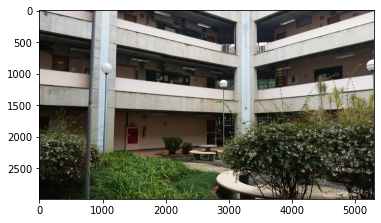

In [6]:
# image_names = ['img3.jpg', 'img2.jpg', 'img4.jpg', 'img1.jpg', 'img5.jpg']
image_names = ['img1.jpg', 'img2.jpg', 'img3.jpg', 'img4.jpg', 'img5.jpg', 'img6.jpg']
imgs = []

for image_name in image_names:
    img = cv2.imread(image_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imgs.append(img)
    

plt.imshow(imgs[0])

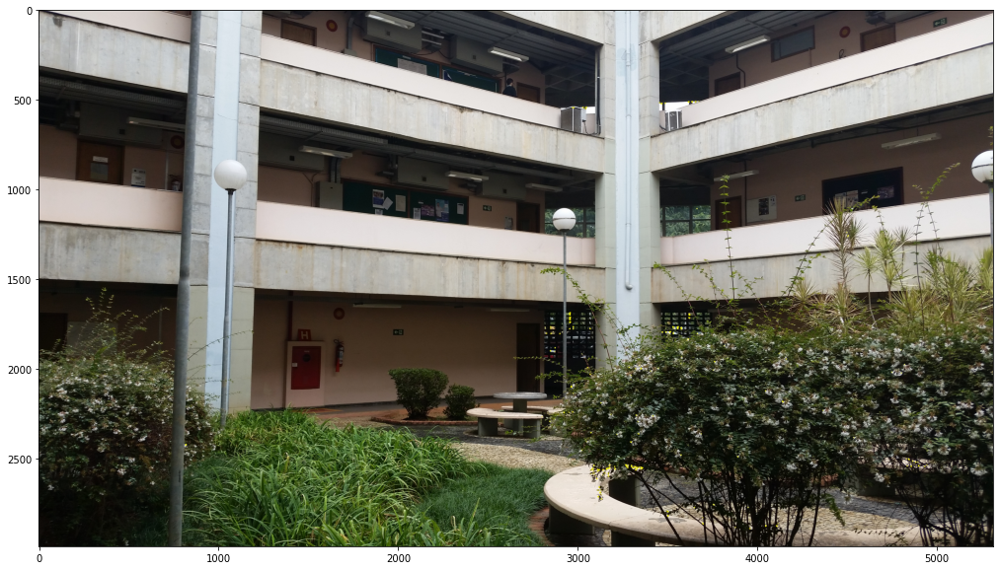

In [7]:
plt.figure(figsize=(20,10))
orb = cv2.ORB_create()
kp = orb.detect(imgs[0], None)
img2 = cv2.drawKeypoints(imgs[0], kp, None, color=(255,255,0), flags=0)
plt.imshow(img2)

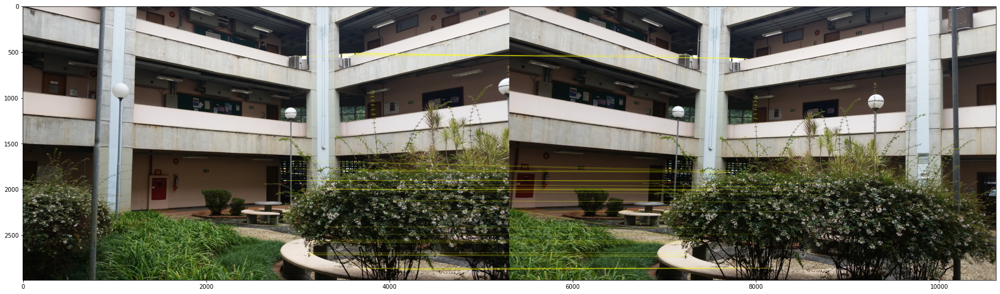

(<matplotlib.image.AxesImage at 0x7efcdc97fd90>, None)

In [8]:
kp1, des1 = orb.detectAndCompute(imgs[0],None)
kp2, des2 = orb.detectAndCompute(imgs[1],None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des2)

matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(imgs[0],kp1,imgs[1],kp2,matches[:50], None, matchColor=(255,255,0), flags=2)
plt.figure(figsize=(30,15))
plt.imshow(img3),plt.show()

In [53]:
key_point_det = cv2.FastFeatureDetector_create(100)
kp_target = key_point_det.detect(imgs[0], None)
kp_source = key_point_det.detect(imgs[1], None)

print(len(kp_target))

brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

kp_target, des_target = brief.compute(imgs[0], kp_target)
kp_source, des_source = brief.compute(imgs[1], kp_source)



5914


In [43]:
des_target.shape

(263326, 32)

In [44]:
des1.shape

(500, 32)

In [47]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
# bf = cv2.BFMatcher(cv2.NORM_L1)
matches = bf.match(des_target[:500],des_source[:500])

In [45]:
len(kp_target)

263326

In [9]:
src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

In [10]:
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
matchesMask = mask.ravel().tolist()

In [11]:
h, w, c = imgs[0].shape

In [12]:
vector1 = np.array([[0, 0, 1], [h, 0, 1], [0, w, 1], [h, w, 1]]).T

In [13]:
options = M.dot(vector1).T

In [14]:
options

array([[-1.84637145e+03, -6.07596015e+02,  1.00000000e+00],
       [ 2.48356952e+03, -2.39818320e+01,  1.25464771e+00],
       [-2.39793946e+03,  6.06767098e+03,  9.67222797e-01],
       [ 1.93200152e+03,  6.65128517e+03,  1.22187051e+00]])

In [15]:
options.max(axis=0)

array([2.48356952e+03, 6.65128517e+03, 1.25464771e+00])

In [16]:
M

array([[ 1.44911010e+00, -1.03834338e-01, -1.84637145e+03],
       [ 1.95319338e-01,  1.25663912e+00, -6.07596015e+02],
       [ 8.52234640e-05, -6.17040712e-06,  1.00000000e+00]])

In [17]:
N = np.array([[1.0, 0.0, 100.0], [0.0, 1.0, 100.0], [0.0, 0.0, 1.0]])

In [18]:
nm = N.dot(M)

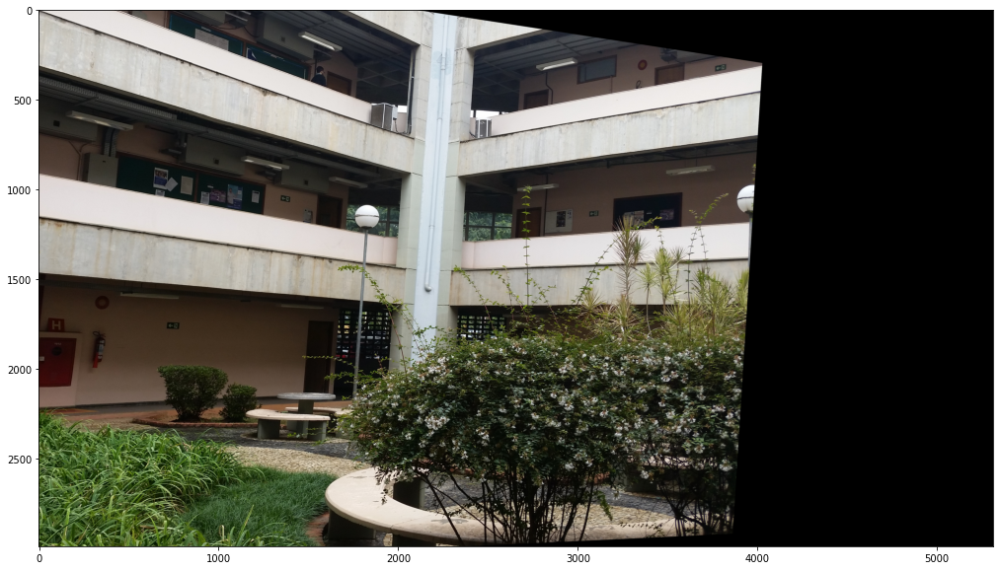

In [19]:
warp = cv2.warpPerspective(imgs[0],M, (w, h))
plt.figure(figsize=(20,10))
plt.imshow(warp)

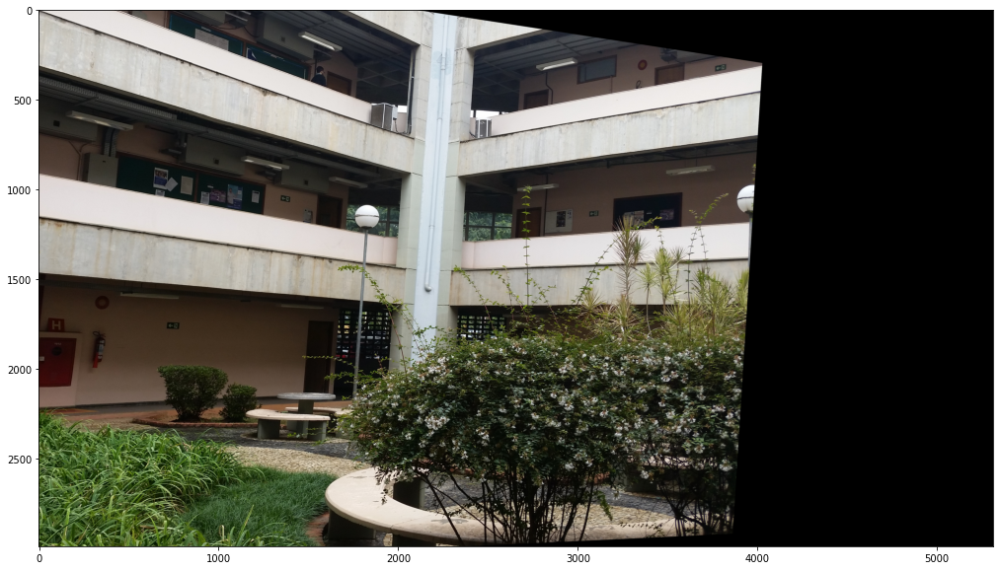

In [20]:
warp = cv2.warpPerspective(imgs[0],M, (w, h))
plt.figure(figsize=(20,10))
plt.imshow(warp)

In [21]:
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = np.array(cv2.perspectiveTransform(pts,M))

In [22]:
print(pts)
print(dst)

[[[   0.    0.]]

 [[   0. 2987.]]

 [[5311. 2987.]]

 [[5311.    0.]]]
[[[-1846.3715   -607.596  ]]

 [[-2197.0178   3205.0574 ]]

 [[ 3862.5957   2916.8545 ]]

 [[ 4027.0994    295.84094]]]


In [63]:
def get_new_image_params(H, w_s, h_s, w_t, h_t):
    pts_s = np.float32([ [0, 0],[0, h_s-1],[w_s-1, h_s-1],[w_s-1,0] ]).reshape(-1,1,2)
    # pts_t = np.float32([ [0, 0],[0, h_t-1],[w_t-1, h_t-1],[w_t-1,0] ]).reshape(-1,1,2)
    dst = np.array(cv2.perspectiveTransform(pts_s, H))
    
    image_limits = np.concatenate( (pts_s, dst) ).reshape(-1,2)
    max_limits = image_limits.max(axis=0)
    print(image_limits)
    min_limits = image_limits.min(axis=0)
    new_dimensions = max_limits - min_limits
    translation = -min_limits
    T = np.array( [[1.0, 0.0, translation[0]], [0.0, 1.0, translation[1]], [0.0, 0.0, 1.0]] )

    return new_dimensions, T
    

def copyOver(source, destination):
    result_grey = cv2.cvtColor(source, cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(result_grey, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    roi = cv2.bitwise_and(source, source, mask=mask)
    im2 = cv2.bitwise_and(destination, destination, mask=mask_inv)
    result = cv2.add(im2, roi)
    return result


def find_keypoint_pairs_sift(target, source):
    key_point_det = cv2.SIFT_create(nfeatures=2500)
    kp_target, des_target = key_point_det.detectAndCompute(target,None)
    kp_source, des_source = key_point_det.detectAndCompute(source,None)
    
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   # or pass empty dictionary

    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des_target,des_source, k=2)
    
    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append(m)

    target_pts = np.float32([ kp_target[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    source_pts = np.float32([ kp_source[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    return target_pts, source_pts
    

def find_keypoint_pairs_orb(target, source):
    key_point_det = cv2.ORB_create(nfeatures=2500)
    
    kp_target, des_target = key_point_det.detectAndCompute(target,None)
    kp_source, des_source = key_point_det.detectAndCompute(source,None)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des_target,des_source)
    target_pts = np.float32([ kp_target[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    source_pts = np.float32([ kp_source[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    return target_pts, source_pts


def find_keypoint_pairs_fast_brief(target, source):
    key_point_det = cv2.FastFeatureDetector_create(100)
    kp_target = key_point_det.detect(target, None)
    kp_source = key_point_det.detect(source, None)
    
    brief = cv2.xfeatures2d.BriefDescriptorExtractor_create(bytes=32)
    kp_target, des_target = brief.compute(target, kp_target)
    kp_source, des_source = brief.compute(source, kp_source)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    # bf = cv2.BFMatcher(cv2.NORM_L1)
    matches = bf.match(des_target,des_source)
    
    target_pts = np.float32([ kp_target[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    source_pts = np.float32([ kp_source[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    return target_pts, source_pts
    


def merge_images(target, source, method='orb'):
    h_t, w_t, _ = target.shape
    h_s, w_s, _ = source.shape
    
    if method == 'orb':
        target_pts, source_pts = find_keypoint_pairs_orb(target, source)
    elif method == 'sift':
        target_pts, source_pts = find_keypoint_pairs_sift(target, source)
    else:
        target_pts, source_pts = find_keypoint_pairs_fast_brief(target, source)
    
    H, mask = cv2.findHomography(target_pts, source_pts, cv2.RANSAC, 5.0)
    
    new_dimension, T = get_new_image_params(H, w_s, h_s, w_t, h_t)
    new_dimension = (int(new_dimension[0]), int(new_dimension[1]))
    
    # print(T)
    M = T.dot(H)
    
    warp_source = cv2.warpPerspective(source, T, new_dimension)
    warp_target = cv2.warpPerspective(target, M, new_dimension)
    
    result = copyOver(warp_source, warp_target)

    return result

[[    0.          0.     ]
 [    0.       2987.     ]
 [ 5311.       2987.     ]
 [ 5311.          0.     ]
 [-1776.7308   -576.62366]
 [-2146.9727   3207.7043 ]
 [ 3830.059    2909.6338 ]
 [ 4019.5564    286.0499 ]]


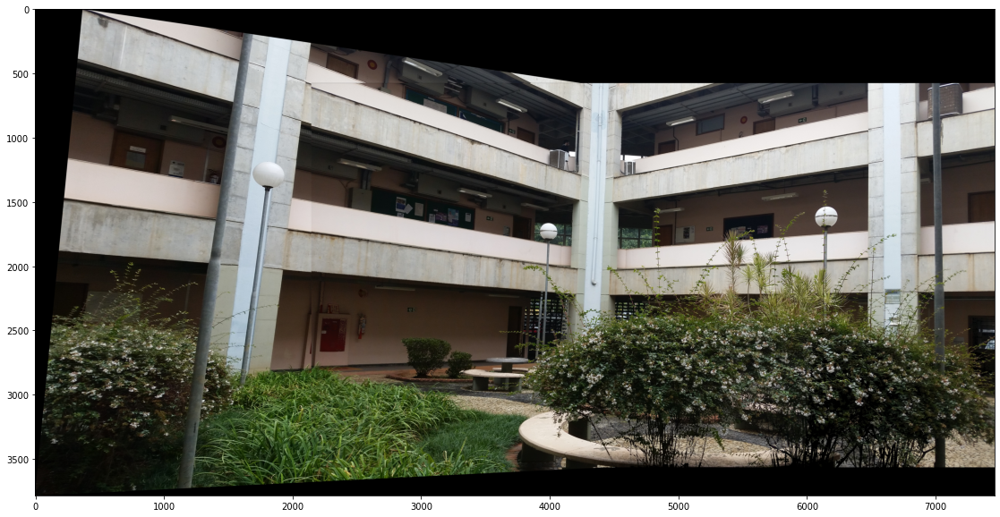

In [62]:
res_l = merge_images(imgs[0], imgs[1], method='orb')
    
plt.figure(figsize=(20,10))
plt.imshow(res_l)

[[   0.         0.     ]
 [   0.      2987.     ]
 [5311.      2987.     ]
 [5311.         0.     ]
 [1174.4054   264.31668]
 [1277.4514  2906.5344 ]
 [7067.0347  3167.6619 ]
 [6898.0933  -507.49353]]


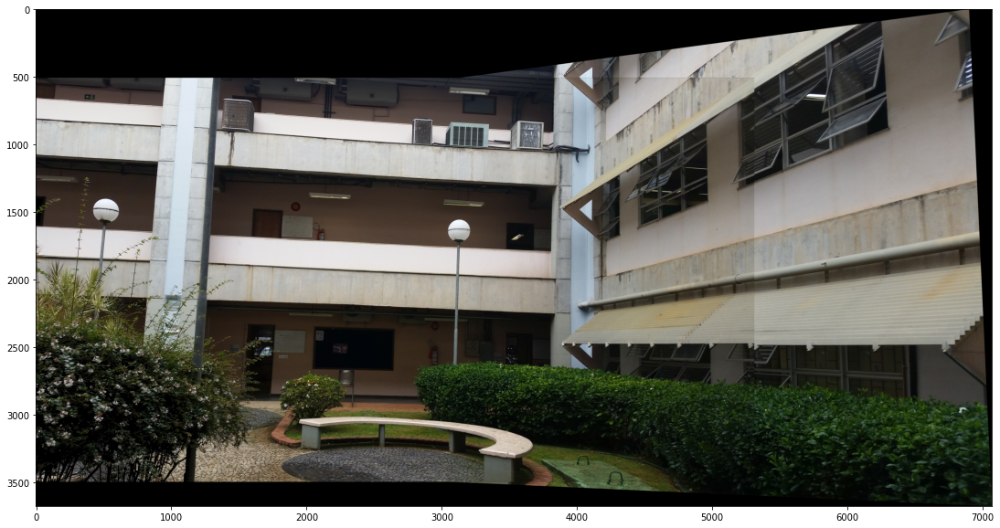

In [56]:
res_r = merge_images(imgs[5], imgs[4])
    
plt.figure(figsize=(20,10))
plt.imshow(res_r)

sift
iniciando match de 2501
finalizando
[[    0.          0.     ]
 [    0.       2987.     ]
 [ 5311.       2987.     ]
 [ 5311.          0.     ]
 [-5313.9927  -1546.6235 ]
 [-6593.8496   2880.2593 ]
 [ 2139.7551   2451.7466 ]
 [ 2284.7239   -372.52185]]


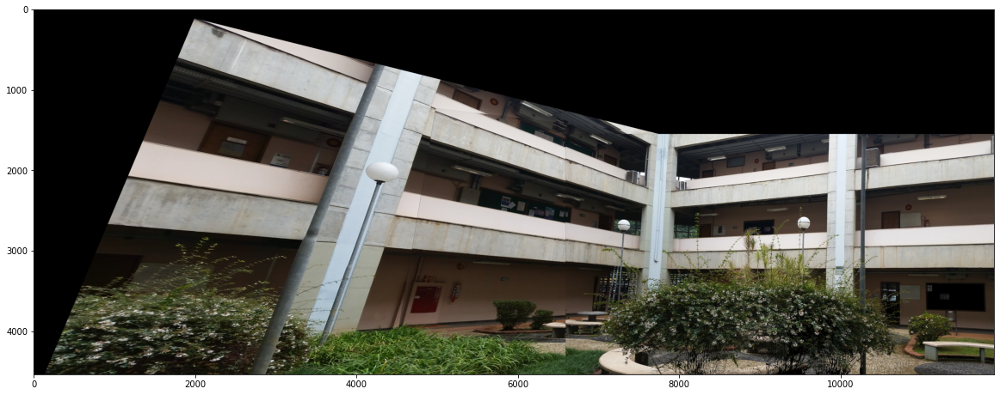

In [28]:
res_l1 = merge_images(res_l, imgs[2])
plt.figure(figsize=(20,10))
plt.imshow(res_l1)

sift
iniciando match de 2501
finalizando
[[   0.          0.      ]
 [   0.       2987.      ]
 [5311.       2987.      ]
 [5311.          0.      ]
 [1329.5986    -16.674746]
 [1436.3721   2620.0957  ]
 [6742.738    2695.4333  ]
 [6461.1147   -514.4631  ]]


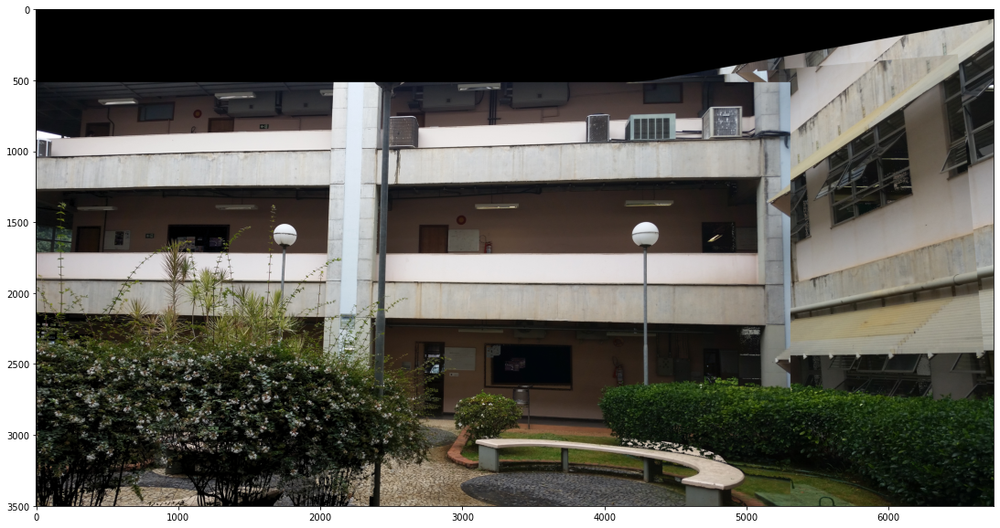

In [29]:
res_r1 = merge_images(res_r, imgs[3])
plt.figure(figsize=(20,10))
plt.imshow(res_r1)


sift
iniciando match de 2500
finalizando
[[     0.          0.    ]
 [     0.       3500.    ]
 [  6741.       3500.    ]
 [  6741.          0.    ]
 [-25171.94    -7055.1416]
 [-22420.012    2577.548 ]
 [ -1964.7244   2475.995 ]
 [ -1950.228   -2179.202 ]]


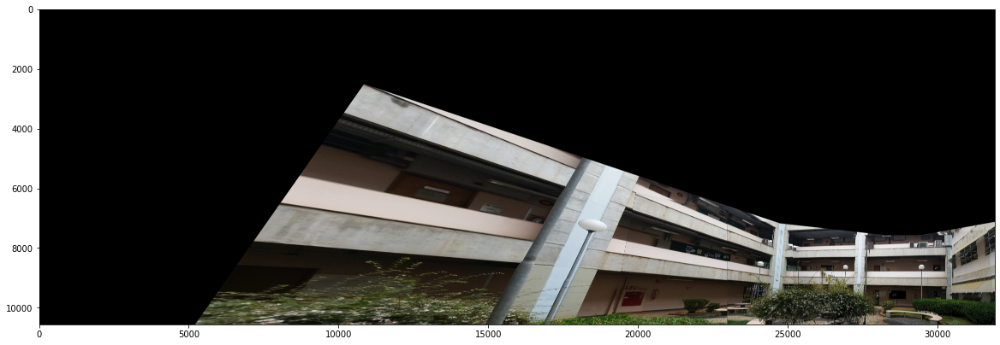

In [30]:
res_c = merge_images(res_l1, res_r1)
plt.figure(figsize=(20,10))
plt.imshow(res_c)